#### Scaling, re-sizing and interpolations

Re-sizing is very easy using the cv2.resize function, it's arguments are: \
cv2.resize(image, dsize(output image size),x scale, y scale, interpolation)

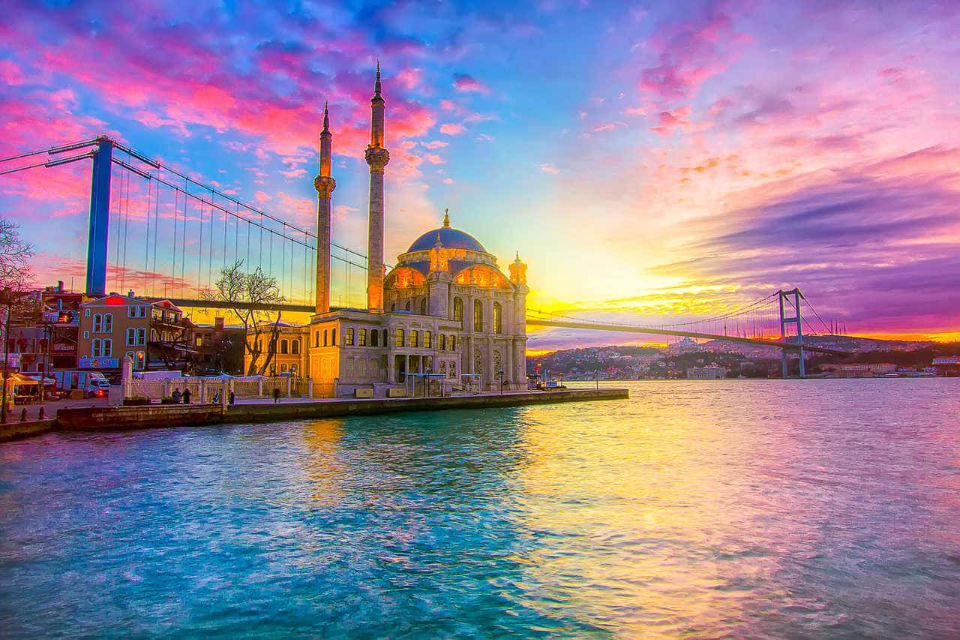

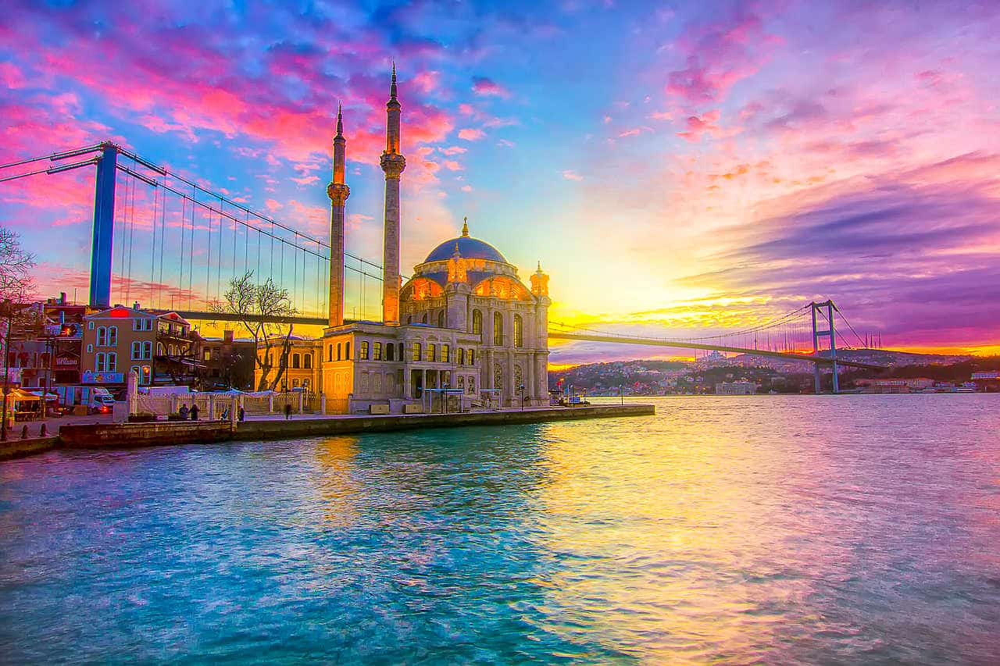

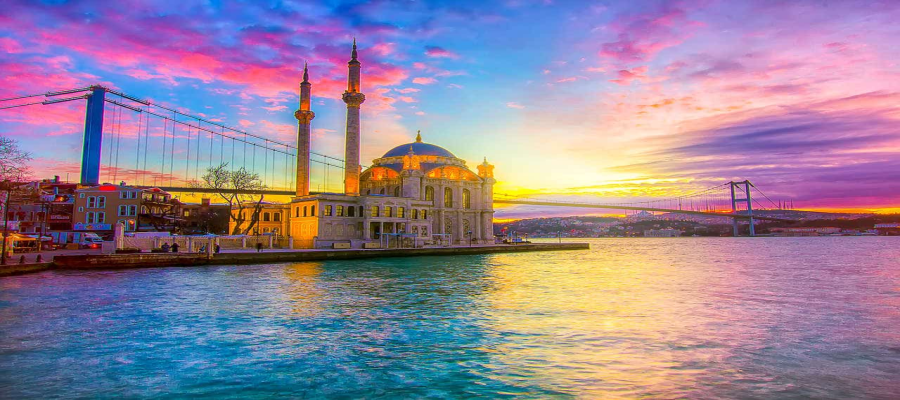

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#load out input image
image = cv2.imread("input.jpg")

# Let's make out image 3/4 of it's original size
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)
# cv2.imshow('Scaling - Linear Interpolation', image_scaled)
cv2_imshow(image_scaled)
cv2.waitKey()

# Let's double the size of out image
img_scaled = cv2.resize(image, None, fx = 2, fy= 2, interpolation = cv2.INTER_CUBIC)
# cv2.imshow('Scaling - Cubic Interpolation',img_scaled)
cv2_imshow(img_scaled)

cv2.waitKey()

# Let's skew the re-sizing by setting exact dimensions
img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)
# cv2.imshow('Scaling - Skewed Size',img_scaled)
cv2_imshow(img_scaled)

cv2.waitKey()

cv2.destroyAllWindows()

# Interpolation

    # What is Interpolation?

    # Resizing an image needs a way to calculate pixel values for the new image from the original one.
    # The five such interpolation methods provided with OpenCV are INTER_NEAREST , INTER_LINEAR , INTER_AREA , INTER_CUBIC , and INTER_LANCZOS4
        # https://medium.com/@wenrudong/what-is-opencvs-inter-area-actually-doing-282a626a09b3

    # https://theailearner.com/2018/11/15/image-interpolation-using-opencv-python/

#### Cropping

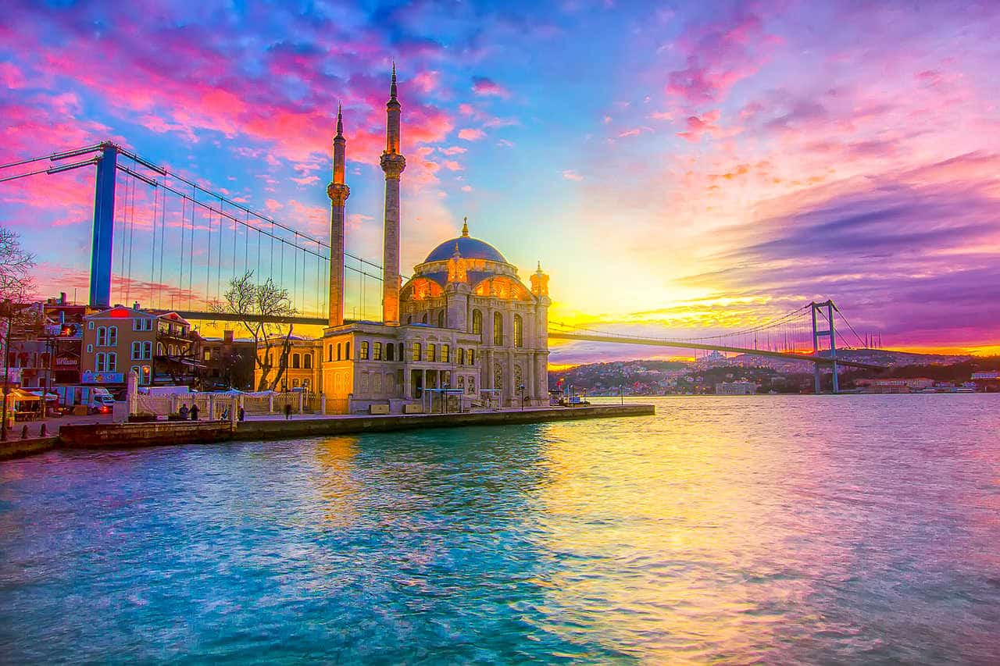

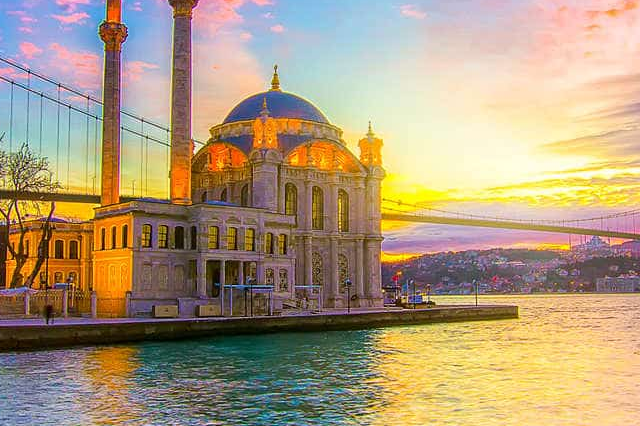

In [4]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread("input.jpg")

height, widht = image.shape[:2]

# Let's get the starting pixel coordinates (top - left of cropping rectangle)
start_row, start_col = int(height * .25), int(widht * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(widht * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row: end_row, start_col:end_col]

# cv2.imshow('Original Image', image)
cv2_imshow(image)
cv2.waitKey(0)
# cv2.imshow('Cropped Image', cropped)
cv2_imshow(cropped)

cv2.waitKey(0)
cv2.destroyAllWindows()

#### Convolutions and Blurring

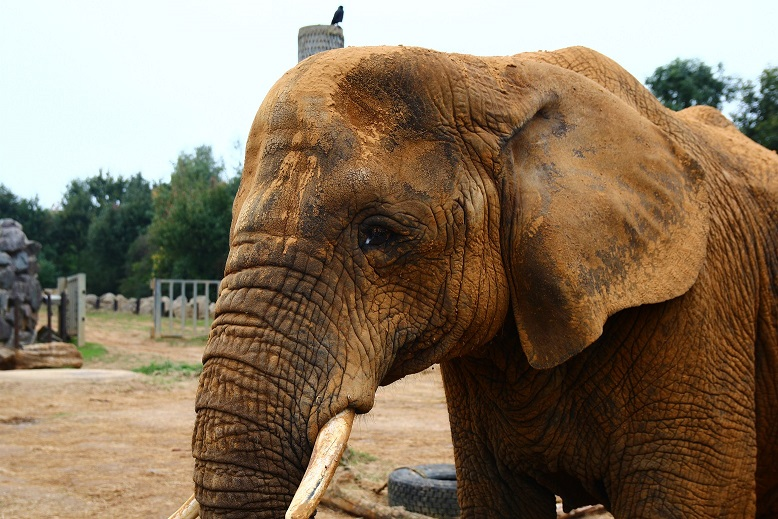

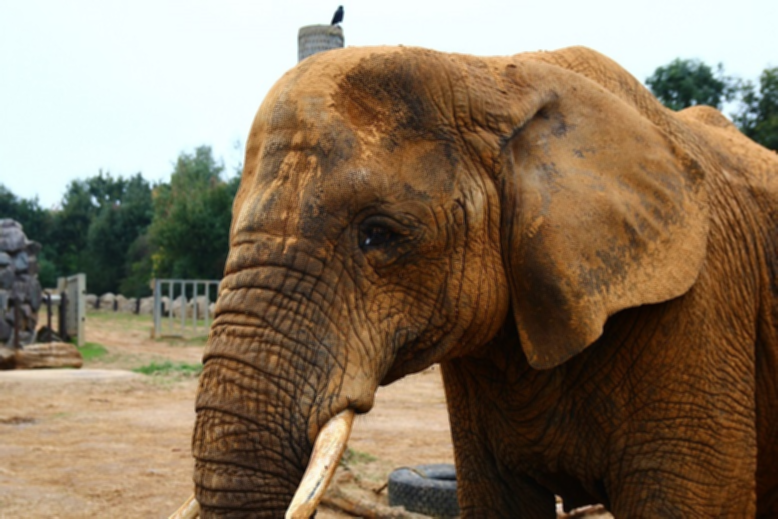

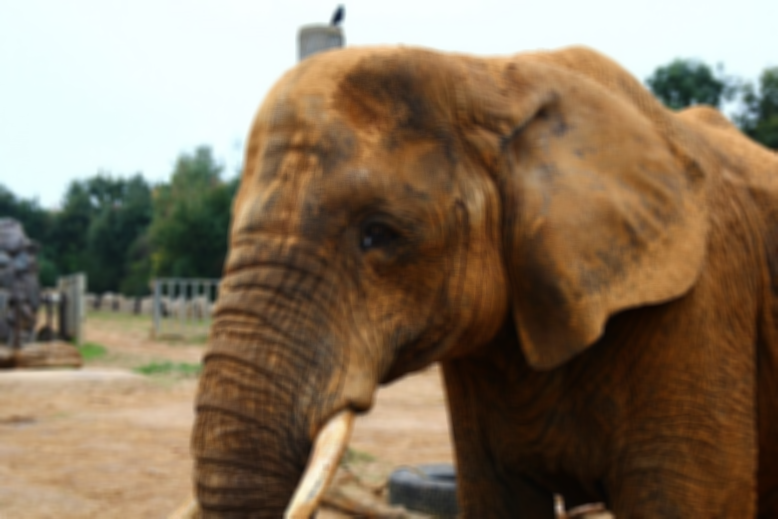

In [8]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread("elephant.jpg")
# cv2.imshow("Original Image", image)
cv2_imshow(image)

# Creating our 3x3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) /9

# We use the cv2.filter2D to convolve the kernel with an image
blurred = cv2.filter2D(image, -1, kernel_3x3)
# cv2.imshow("3x3 Kernel Blurring", blurred)
cv2_imshow(blurred)
cv2.waitKey(0)

# Creating 7x7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)
# cv2.imshow("7x7 Kernel Blurring", kernel_7x7)
cv2_imshow(blurred2)
cv2.waitKey(0)

cv2.destroyAllWindows()

# https://pyimagesearch.com/2016/07/25/convolutions-with-opencv-and-python/

    # An (image) convolution is simply an element-wise multiplication of two matrices followed by a sum.

# Element-Wise Multiplication in Python

    # https://www.delftstack.com/howto/numpy/element-wise-multiplication-python/


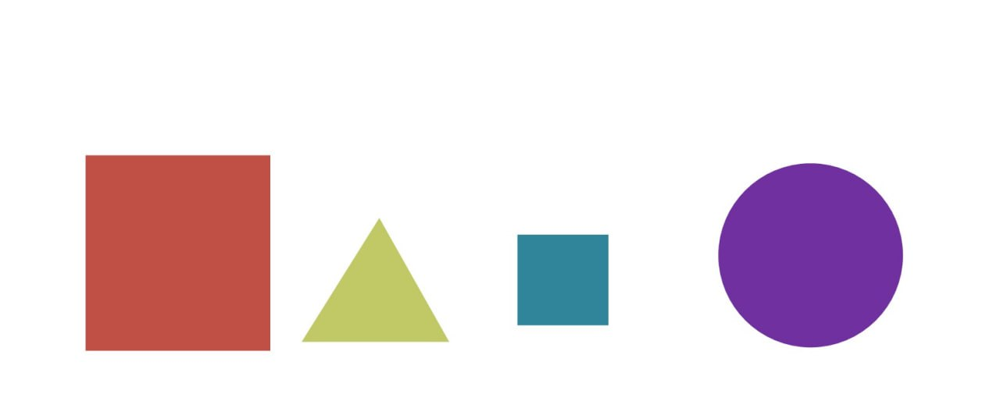

In [9]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread("bunchofshapes.jpg")
# cv2.imshow("0 - Original Image", image)
cv2_imshow(image)

# Grayscale our image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find Canny edges
edged = cv2.Canny(gray, 50, 200)
#cv2.imshow('1 - Canny Edges', edged)
cv2_imshow(edged)
cv2.waitKey(0)

# Find contours and print how many were found
contours, hierarchy = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print("Number of contours found =", len(contours))

# Draw all contours
cv2.drawContours(blank_image, contours, -1, (0, 255, 0), 3)
cv2.imshow('2 - All Contours over blank image', blank_image)
# cv_imshow(blank_image)
cv2.waitKey(0)

# Draw all countours over blank image
cv2.drawContours(image, contours, -1, (0, 255,0), 3)
# cv2.imshow('3 - All Contours', image)
cv2_imshow(image)

cv2.waitKey(0)
cv2.destroyAllWindows()